# Exploracion de los datos en diferentes longitudes de onda SDO-AIA

## Imports

In [1]:
import os
import sunpy.map
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np


Explore with one IMG and sisualization of MeataData

In [ ]:
file1 = sunpy.map.Map("/home/alyonaivanova/personal/SOLAR/Data/multichannel_SDO_AIA/131.0Å/aia.lev1.131A_2020_09_01T00_00_06.62Z.image_lev1.fits")

In [ ]:
file1.meta

In [ ]:
file1.meta["naxis"]

##  Ruta a las IMG

In [2]:
# Ruta base a tus imágenes
base_dir = "/home/alyonaivanova/personal/SOLAR/Data/multichannel_SDO_AIA/"
# Definir los canales
channels = ["131.0Å", "171.0Å", "193.0Å", "211.0Å", "304.0Å", "335.0Å", "1600.0Å", "1700.0Å", "4500.0Å"]

##  Colormaps y descripciones por canal para cada longitud de onda

### **Paso 1:  Crear Mosaico de Imágenes**
las longitudes de onda correspondientes a cada canal
- **131.0Å**: 10 million K (Flare Plasma)
- **171.0Å**: 1 million K (Quiet Corona)
- **193.0Å**: 1.25 million K (Active Corona)
- **211.0Å**: 2 million K (Hot Corona)
- **304.0Å**: 50,000 K (Chromosphere/Transition Region)
- **335.0Å**: 2.5 million K (Active Region Corona)
- **1600.0Å**: 6,000 K (Transition Region)
- **1700.0Å**: 5,000 K (Photosphere)
- **4500.0Å**: 6,000 K (Photosphere Continuum)


In [3]:
channel_properties = {
    "131.0Å": {"cmap": "Blues", "description": "10 million K (Flare Plasma)"},
    "171.0Å": {"cmap": "YlGnBu", "description": "1 million K (Quiet Corona)"},
    "193.0Å": {"cmap": "Oranges", "description": "1.25 million K (Active Corona)"},
    "211.0Å": {"cmap": "Reds", "description": "2 million K (Hot Corona)"},
    "304.0Å": {"cmap": "PuRd", "description": "50,000 K (Chromosphere/Transition Region)"},
    "335.0Å": {"cmap": "Purples", "description": "2.5 million K (Active Region Corona)"},
    "1600.0Å": {"cmap": "pink", "description": "6,000 K (Transition Region)"},
    "1700.0Å": {"cmap": "Greys", "description": "5,000 K (Photosphere)"},
    "4500.0Å": {"cmap": "coolwarm", "description": "6,000 K (Photosphere Continuum)"}
}

channels = list(channel_properties.keys())

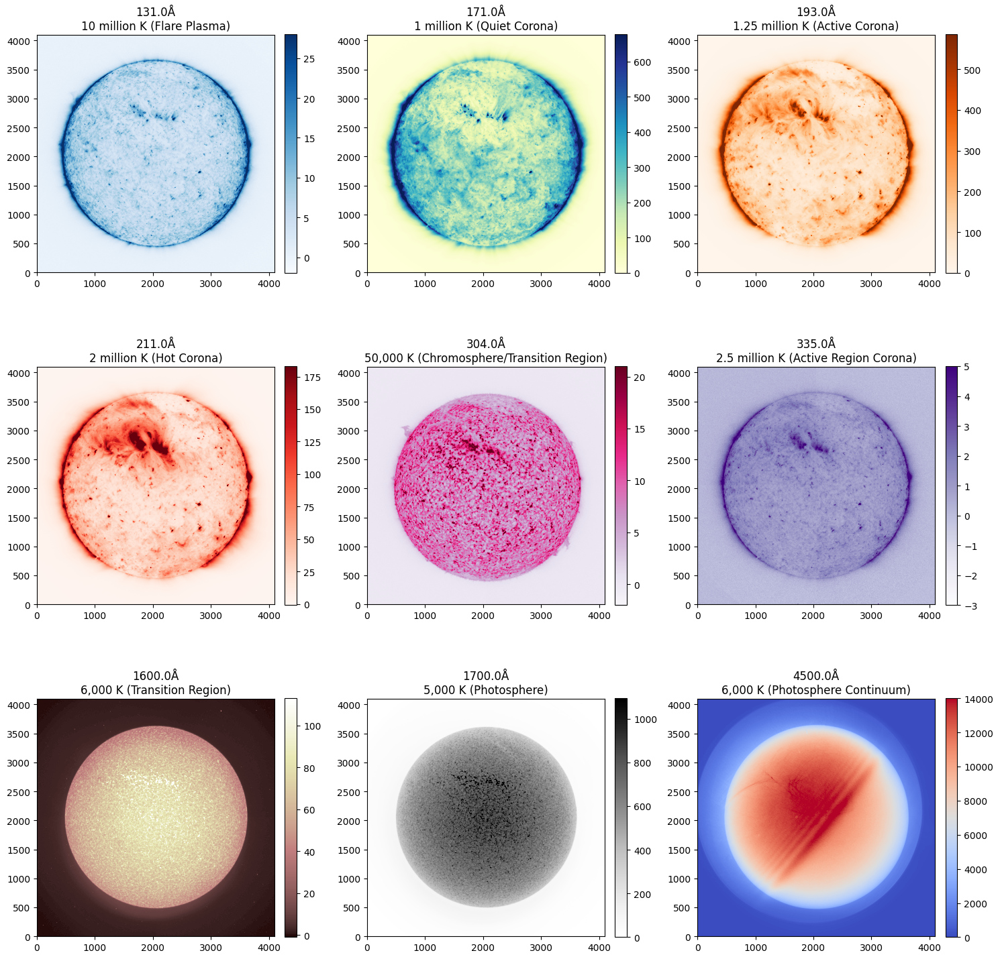

In [ ]:
table_data = []
channel_data = {}

# Función para procesar y mostrar una sola imagen
def process_and_plot_image(channel, ax):
    channel_dir = os.path.join(base_dir, channel)
    fits_files = [f for f in os.listdir(channel_dir) if f.endswith(".fits")]
    
    if fits_files:  # Verificar si hay archivos FITS
        fits_path = os.path.join(channel_dir, fits_files[0])
        aia_map = sunpy.map.Map(fits_path)
        data = aia_map.data  # Obtener el arreglo numpy 2D
        
        # Extraer metadatos clave
        metadata = aia_map.meta
        cdelt1 = metadata.get("cdelt1", "N/A")
        cdelt2 = metadata.get("cdelt2", "N/A")
        crota2 = metadata.get("crota2", "N/A")
        naxis1 = metadata.get("naxis1", "N/A")
        naxis2 = metadata.get("naxis2", "N/A")
        
        # Añadir metadatos a la tabla
        table_data.append({
            "Channel": channel,
            "CDELT1": cdelt1,
            "CDELT2": cdelt2,
            "CROTA2": crota2,
            "NAXIS1": naxis1,
            "NAXIS2": naxis2
        })
        
        # Guardar los datos aplanados para scatter plots
        channel_data[channel] = data.flatten()
        
        # Establecer límites de visualización (vmin, vmax)
        vmin = np.percentile(data, 1)  # 1er percentil
        vmax = np.percentile(data, 99)  # 99º percentil
        
        # Mostrar la imagen en el eje
        props = channel_properties.get(channel, {"cmap": "gray", "description": "Unknown"})
        im = ax.imshow(data, origin='lower', cmap=props["cmap"], vmin=vmin, vmax=vmax)
        ax.set_title(f"{channel}\n{props['description']}", color="black")
        fig.colorbar(im, ax=ax, orientation="vertical", fraction=0.046, pad=0.04)
    else:
        ax.set_title(f"{channel} (No Data)", color="black")
        ax.axis("off")
        
# Crear la figura y los ejes para el mosaico
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

# Procesar cada canal individualmente
for i, channel in enumerate(channels):
    process_and_plot_image(channel, axes[i])

# Ajustar diseño
plt.tight_layout()
plt.show()


### **Paso 2: Crear la tabla de parámetros clave extraidos de los metaDatos**
Los parámetros clave que extraeremos para cada filtro son:
- **CDELT1**: Tamaño del píxel en dirección X.
- **CDELT2**: Tamaño del píxel en dirección Y.
- **CROTA2**: Rotación.
- **NAXIS1** y **NAXIS2**: Tamaño de la imagen.

In [5]:
df = pd.DataFrame(table_data)
print(df)

   Channel    CDELT1    CDELT2    CROTA2  NAXIS1  NAXIS2
0   131.0Å  0.600698  0.600698 -0.138902    4096    4096
1   171.0Å  0.599489  0.599489  0.019441    4096    4096
2   193.0Å  0.600714  0.600714  0.057708    4096    4096
3   211.0Å  0.600758  0.600758  0.056357    4096    4096
4   304.0Å  0.600165  0.600165 -0.131746    4096    4096
5   335.0Å  0.600737  0.600737 -0.142371    4096    4096
6  1600.0Å  0.609373  0.609373  0.019860    4096    4096
7  1700.0Å  0.612898  0.612898  0.020444    4096    4096
8  4500.0Å  0.599945  0.599945  0.020710    4096    4096


## Generar scatter plots entre canales

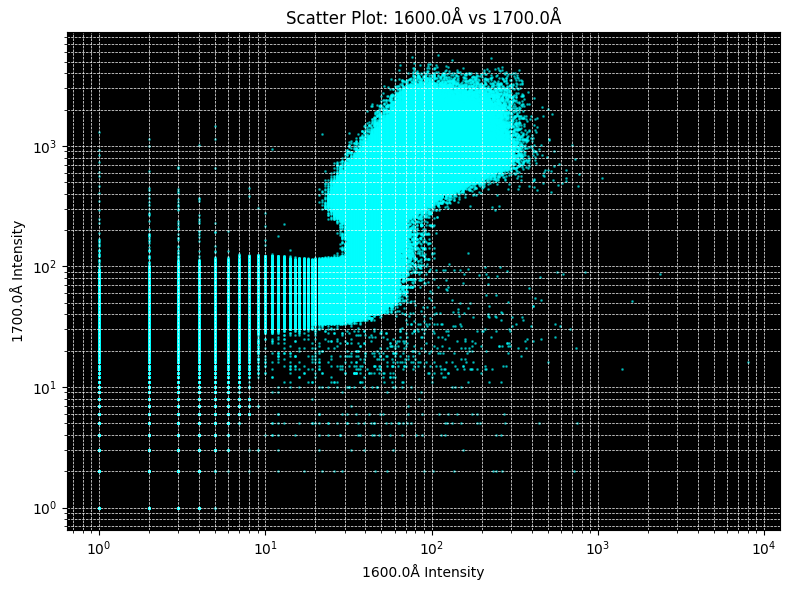

In [6]:
# Ejemplo
c1, c2 = "1600.0Å", "1700.0Å"  

if c1 in channel_data and c2 in channel_data:
    data1 = channel_data[c1]
    data2 = channel_data[c2]
    
    # Scatter plot
    plt.figure(figsize=(8, 6), facecolor="white")  # Fondo negro para la figura
    plt.gca().set_facecolor('black')  # Fondo negro para los ejes
    plt.scatter(data1, data2, s=1, alpha=0.5, c="cyan")  # Puntos en color cian
    plt.title(f"Scatter Plot: {c1} vs {c2}", color="black")  # Título en blanco
    plt.xlabel(f"{c1} Intensity", color="black")  # Etiqueta X en blanco
    plt.ylabel(f"{c2} Intensity", color="black")  # Etiqueta Y en blanco
    plt.xscale("log")
    plt.yscale("log")
    plt.grid(True, which="both", linestyle="--", linewidth=0.5, color="white")
    plt.tight_layout()
    plt.show()


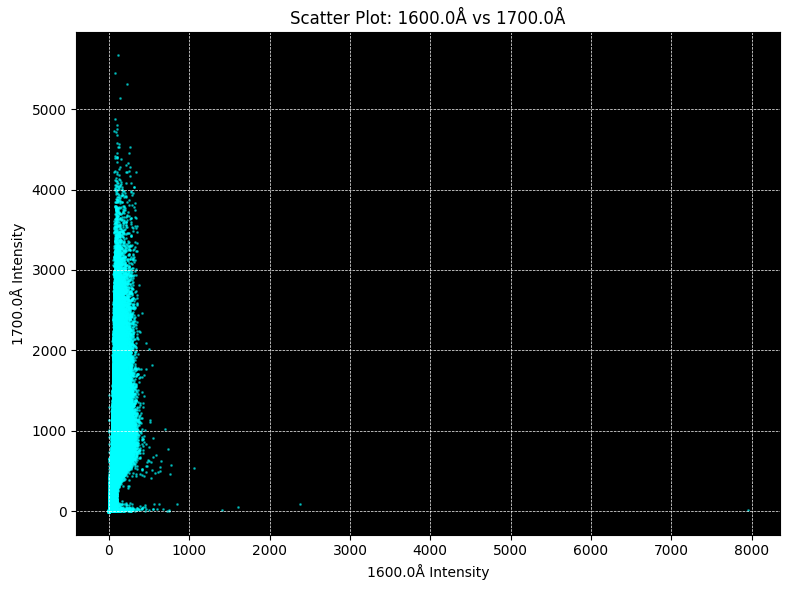

In [7]:
# Ejemplo
c1, c2 = "1600.0Å", "1700.0Å"  

if c1 in channel_data and c2 in channel_data:
    data1 = channel_data[c1]
    data2 = channel_data[c2]
    
    # Scatter plot
    plt.figure(figsize=(8, 6), facecolor="white")  # Fondo negro para la figura
    plt.gca().set_facecolor('black')  # Fondo negro para los ejes
    plt.scatter(data1, data2, s=1, alpha=0.5, c="cyan")  # Puntos en color cian
    plt.title(f"Scatter Plot: {c1} vs {c2}", color="black")  # Título en blanco
    plt.xlabel(f"{c1} Intensity", color="black")  # Etiqueta X en blanco
    plt.ylabel(f"{c2} Intensity", color="black")  # Etiqueta Y en blanco
    # plt.xscale("log")
    # plt.yscale("log")
    plt.grid(True, which="both", linestyle="--", linewidth=0.5, color="white")
    plt.tight_layout()
    plt.show()


## Mascara

Observamos que los pixeles afuera del disco solar solo generaran ruido, entonces para
solucionar est voamos a implementar una máscara circular para eliminar los píxeles que no pertenecen
al disco solar. Usaremos la tabla de metadatos para determinar el radio del Sol en 
píxeles y crear la máscara.


### Pasos
1. **Calcular el radio del Sol en píxeles**:
   - Usamos el metadato `R_SUN` y la escala en píxeles (`CDELT1` o `CDELT2`).
2. **Crear la máscara circular**:
   - Usaremos la ecuación del círculo:
     \[
     (x - x_{\text{centro}})^2 + (y - y_{\text{centro}})^2 < R^2
     \]
3. **Aplicar la máscara**:
   - Establecemos los píxeles fuera del círculo como `NaN` o `0`.

In [9]:
def create_circular_mask(data, metadata):
    """
    Crea una máscara circular adaptada al disco solar en los datos.
    """
    ny, nx = data.shape
    x_center = nx // 2
    y_center = ny // 2
    
    # Determinar el radio del Sol en píxeles usando cdelt1 y cdelt2
    cdelt1 = metadata.get("cdelt1", 1.0)  # Arcsec/píxel en X
    solar_radius_arcsec = metadata.get("rsun_obs", 960.0)  # Radio solar en arcsec
    solar_radius_pixels = int(solar_radius_arcsec / cdelt1)

    # Crear las coordenadas de la malla
    y, x = np.ogrid[:ny, :nx]
    distance_from_center = np.sqrt((x - x_center)**2 + (y - y_center)**2)

    # Crear la máscara
    mask = distance_from_center <= solar_radius_pixels
    return mask


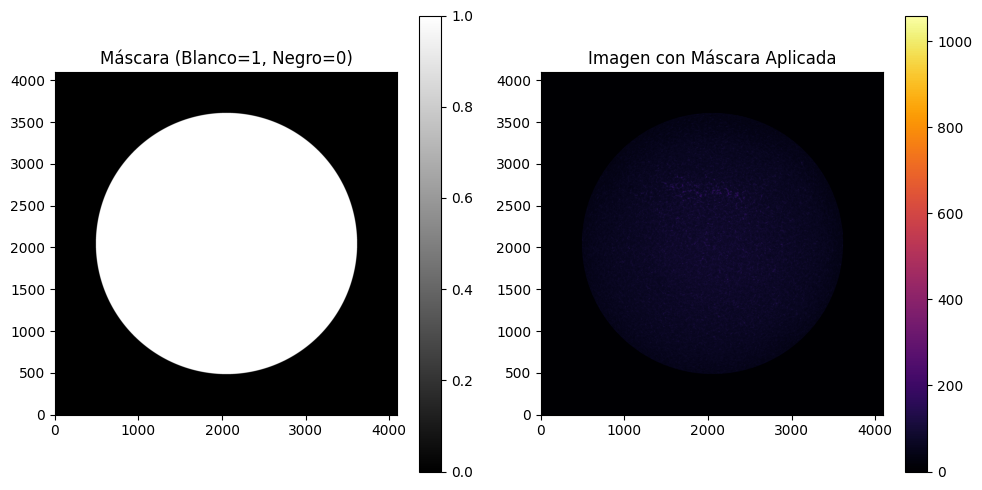

In [ ]:
def visualize_mask(data, mask):
    """
    Visualiza la máscara sobre la imagen.
    """
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Máscara (Blanco=1, Negro=0)")
    plt.imshow(mask, origin='lower', cmap='gray')
    plt.colorbar()
    
    plt.subplot(1, 2, 2)
    plt.title("Imagen con Máscara Aplicada")
    masked_data = data * mask
    plt.imshow(masked_data, origin='lower', cmap='inferno')
    plt.colorbar()
    plt.tight_layout()
    plt.show()

# Crear y visualizar la máscara para una imagen de ejemplo
fits_path = os.path.join(base_dir, "1600.0Å", os.listdir(os.path.join(base_dir, "1600.0Å"))[0])
aia_map = sunpy.map.Map(fits_path)
data = aia_map.data
metadata = aia_map.meta

# Crear y visualizar la máscara para esta imagen
mask = create_circular_mask(data, metadata)
visualize_mask(data, mask)


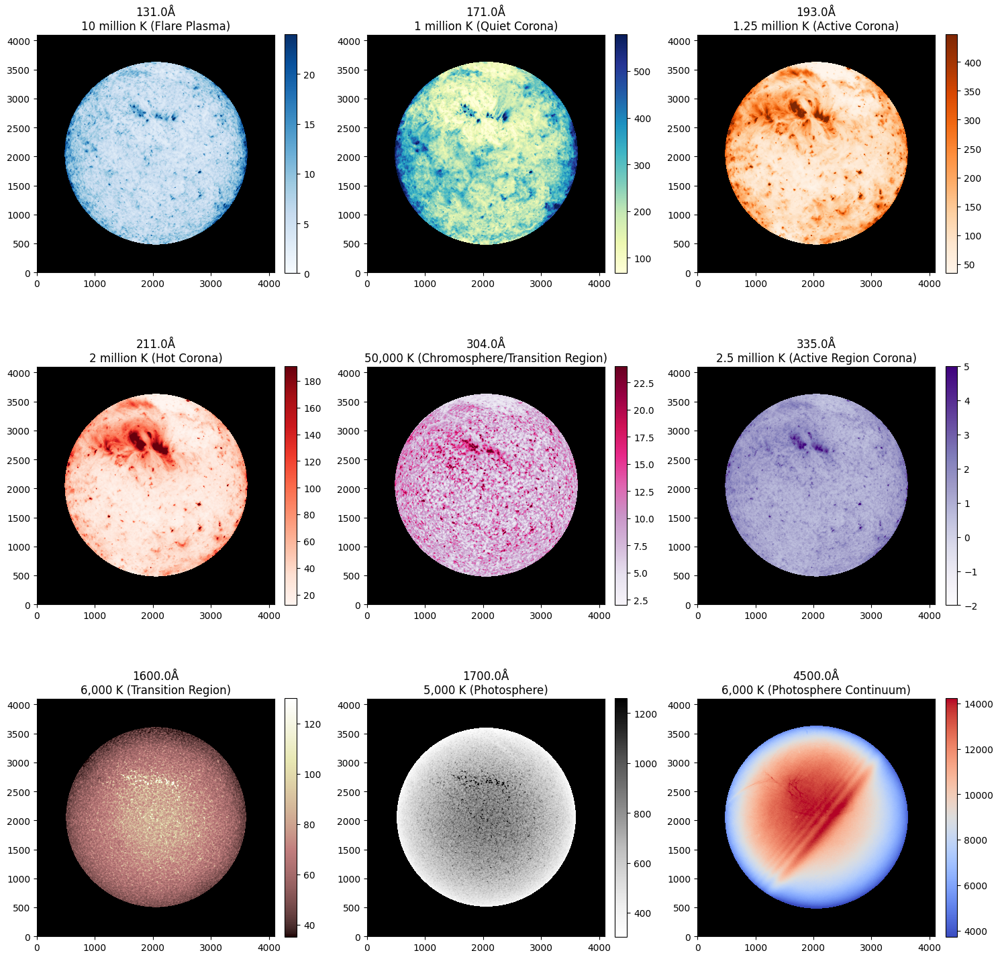

In [13]:
table_data_process = []
channel_data_process = {}

def process_and_plot_image_with_mask(channel, ax):
    channel_dir = os.path.join(base_dir, channel)
    fits_files = [f for f in os.listdir(channel_dir) if f.endswith(".fits")]
    
    if fits_files:  # Verificar si hay archivos FITS
        fits_path = os.path.join(channel_dir, fits_files[0])
        aia_map = sunpy.map.Map(fits_path)
        data = aia_map.data  # Obtener el arreglo numpy 2D
        
        # Crear máscara circular
        mask = create_circular_mask(data, aia_map.meta)
        masked_data = data.copy()  # Copiar los datos originales
        masked_data[~mask] = np.nan  # Aplicar la máscara: fuera del círculo -> NaN
        
        
        # Guardar los datos aplanados para scatter plots
        channel_data_process[channel] = masked_data.flatten()
        
        # Establecer límites de visualización (vmin, vmax)
        vmin = np.nanpercentile(masked_data, 1)  # 1er percentil (ignorando NaN)
        vmax = np.nanpercentile(masked_data, 99)  # 99º percentil (ignorando NaN)
        
        # Configurar el fondo negro para el eje
        ax.set_facecolor("black")
        
        # Mostrar la imagen en el eje
        props = channel_properties.get(channel, {"cmap": "gray", "description": "Unknown"})
        im = ax.imshow(masked_data, origin='lower', cmap=props["cmap"], vmin=vmin, vmax=vmax)
        ax.set_title(f"{channel}\n{props['description']}", color="black")
        fig.colorbar(im, ax=ax, orientation="vertical", fraction=0.046, pad=0.04)
    else:
        ax.set_title(f"{channel} (No Data)", color="white")
        ax.axis("off")

# Crear la figura y los ejes para el mosaico
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

# Cambiar el fondo de la figura a negro
fig.patch.set_facecolor("white")

# Procesar cada canal individualmente con la máscara
for i, channel in enumerate(channels):
    process_and_plot_image_with_mask(channel, axes[i])

# Ajustar diseño
plt.tight_layout()
plt.show()


## Generar scatter plots entre canales

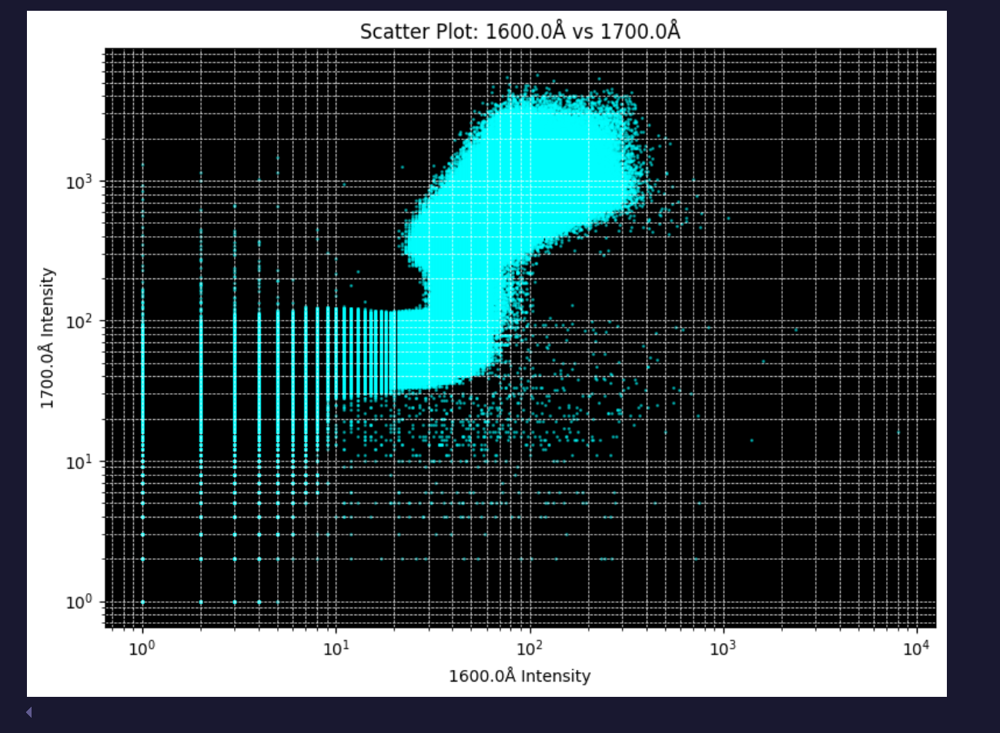 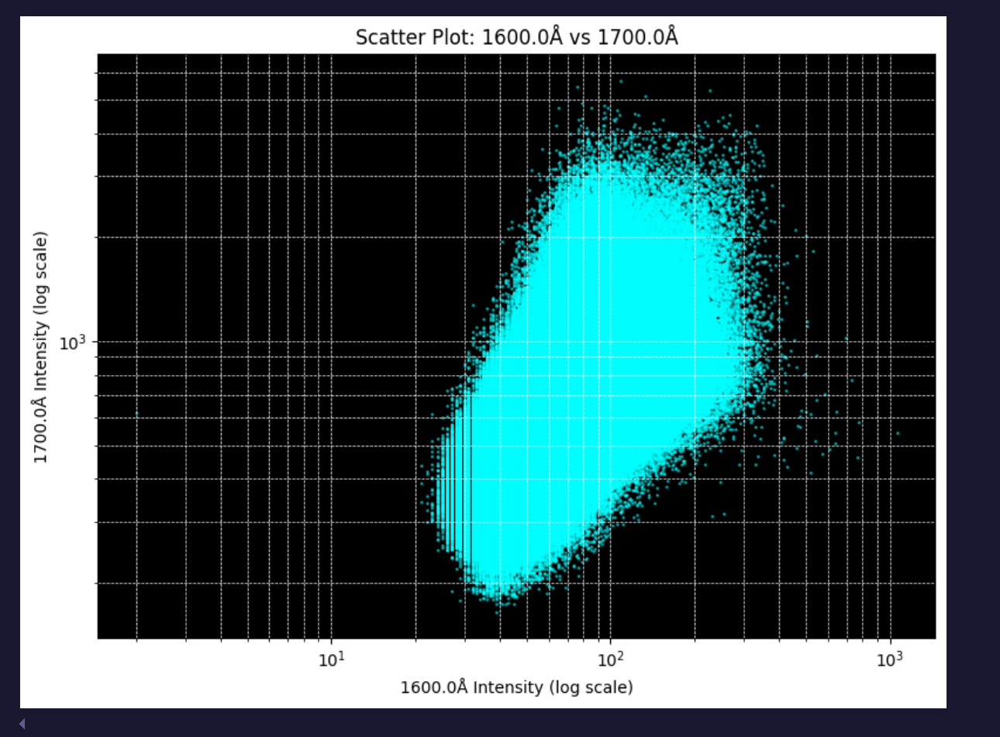


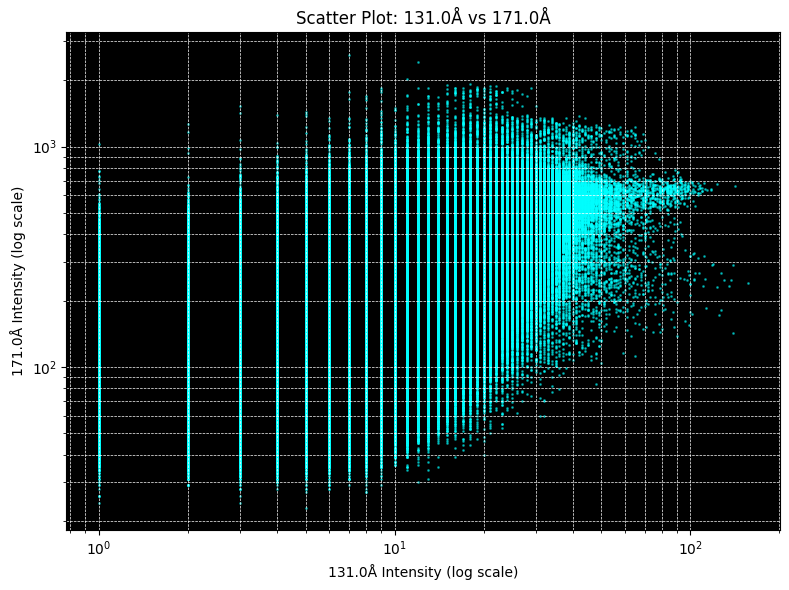

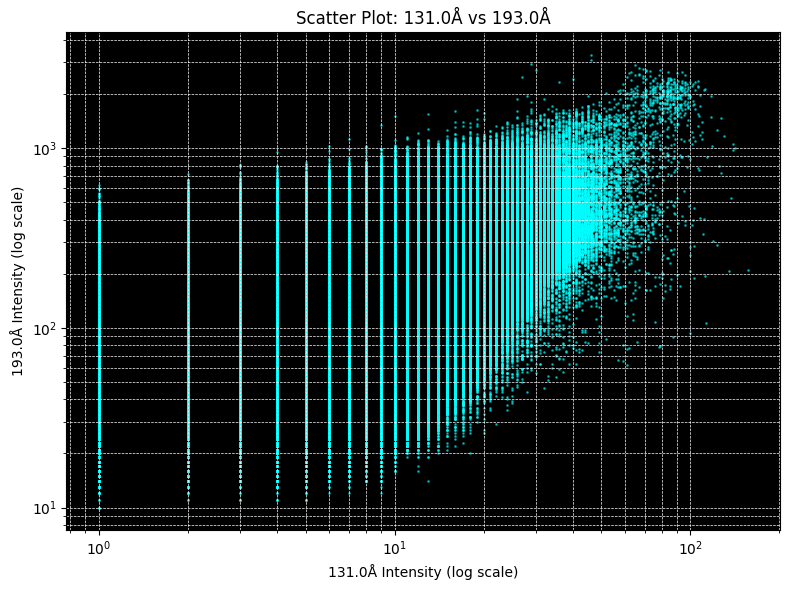

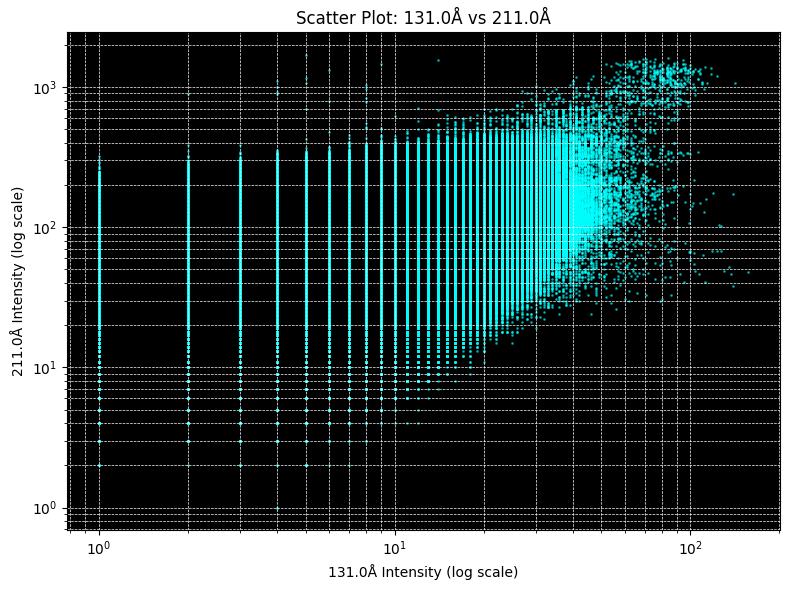

...

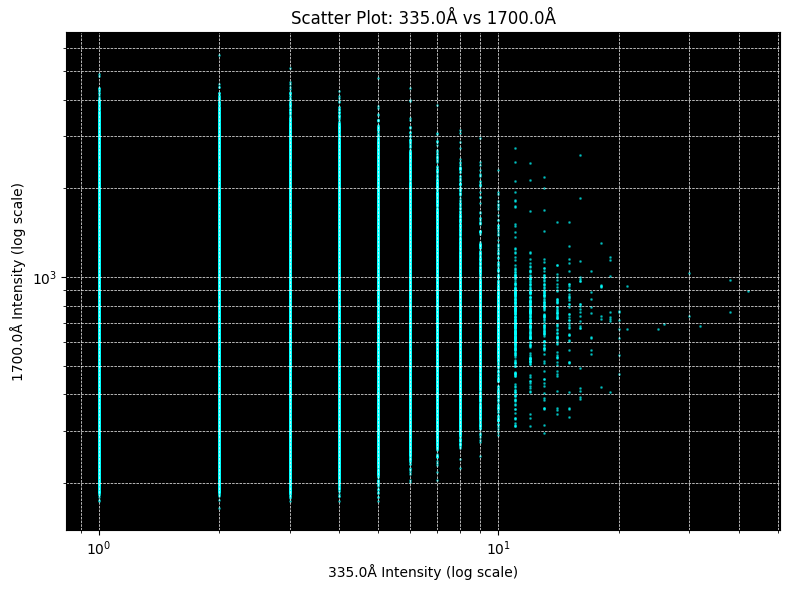

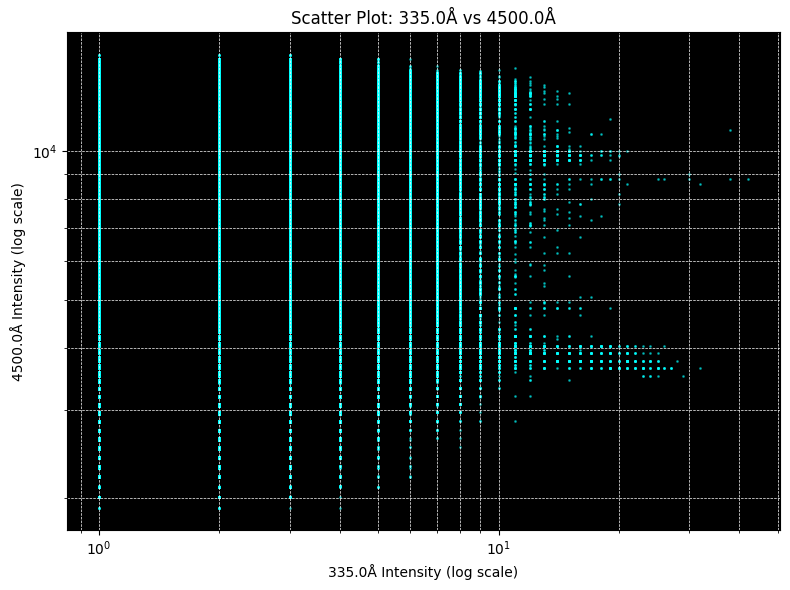

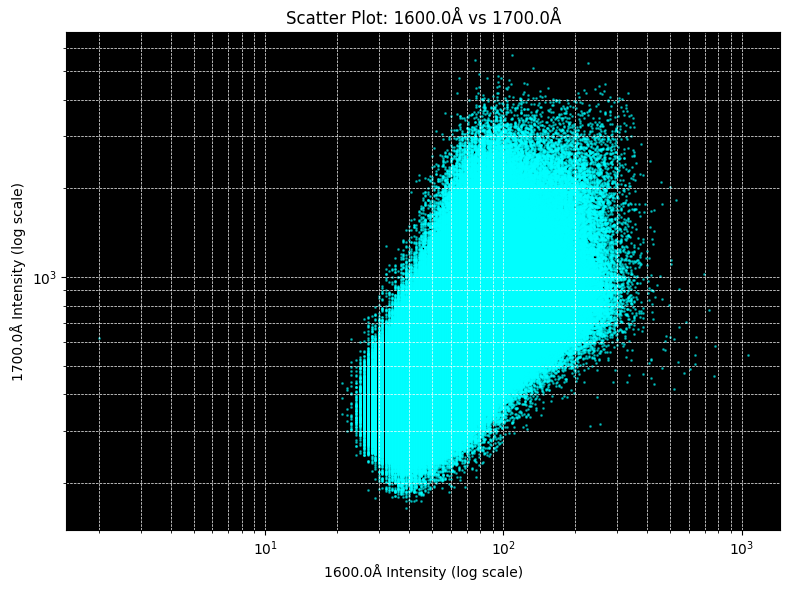

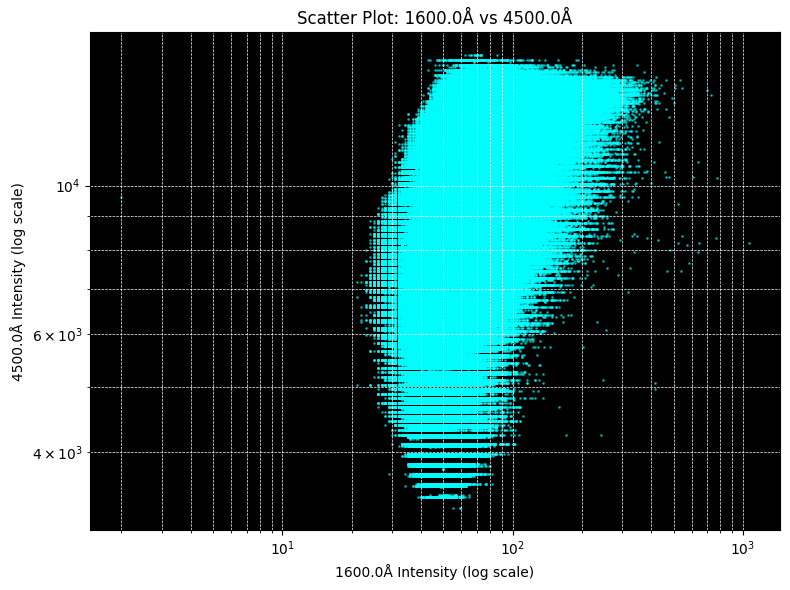

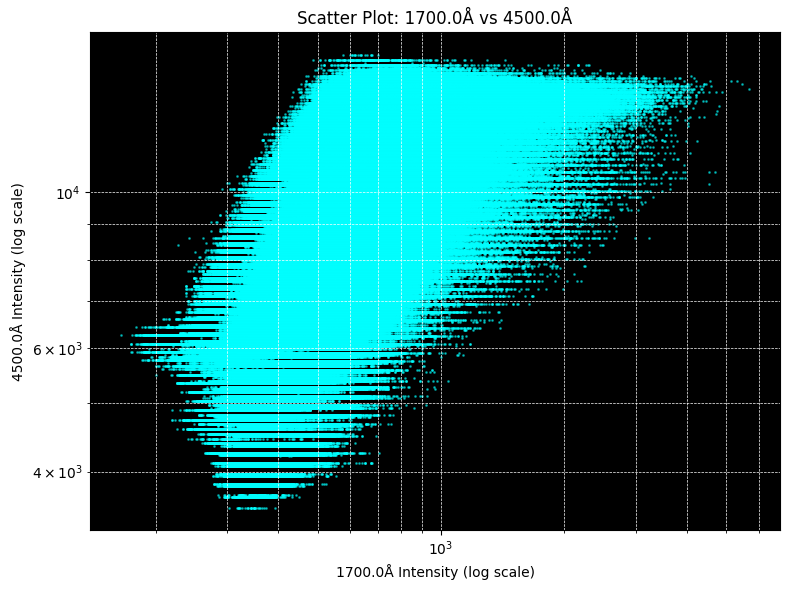

In [18]:
combinations = [(c1, c2) for i, c1 in enumerate(channels) for c2 in channels[i+1:]]
for c1, c2 in combinations:
    if c1 in channel_data and c2 in channel_data:
        data1 = channel_data_process[c1]
        data2 = channel_data_process[c2]
        
        # Filtrar valores válidos (positivos y no NaN)
        valid_mask = (~np.isnan(data1)) & (~np.isnan(data2)) & (data1 > 0) & (data2 > 0)
        data1 = data1[valid_mask]
        data2 = data2[valid_mask]
        
        if len(data1) == 0 or len(data2) == 0:
            print(f"Sin datos válidos para los canales {c1} y {c2}.")
            continue
        
        # Scatter plot
        plt.figure(figsize=(8, 6), facecolor="white")  # Fondo negro para la figura
        plt.gca().set_facecolor('black')  # Fondo negro para los ejes
        plt.scatter(data1, data2, s=1, alpha=0.5, c="cyan")  # Puntos en color cian
        plt.title(f"Scatter Plot: {c1} vs {c2}", color="black")  # Título en blanco
        plt.xlabel(f"{c1} Intensity (log scale)", color="black")  # Etiqueta X en blanco con aclaración
        plt.ylabel(f"{c2} Intensity (log scale)", color="black")  # Etiqueta Y en blanco con aclaración
        plt.xscale("log")
        plt.yscale("log")
        plt.grid(True, which="both", linestyle="--", linewidth=0.5, color="white")
        plt.tight_layout()
        plt.show()


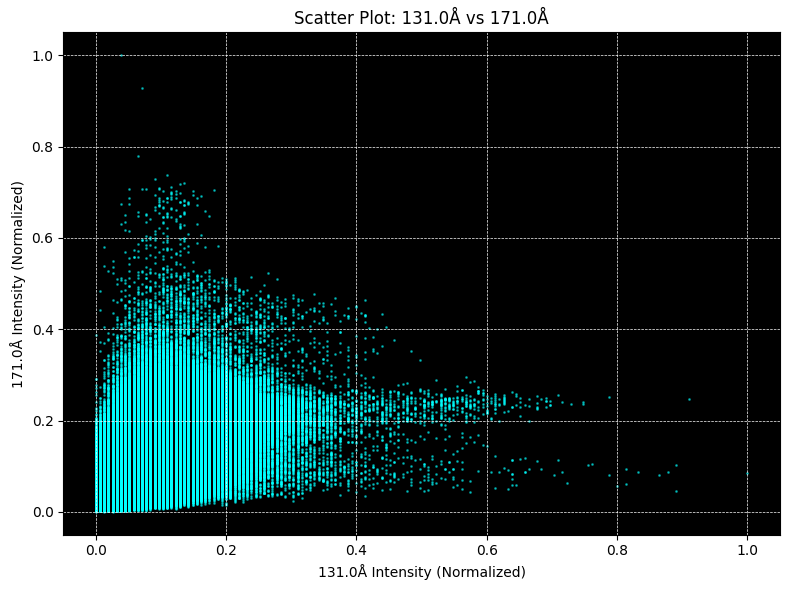

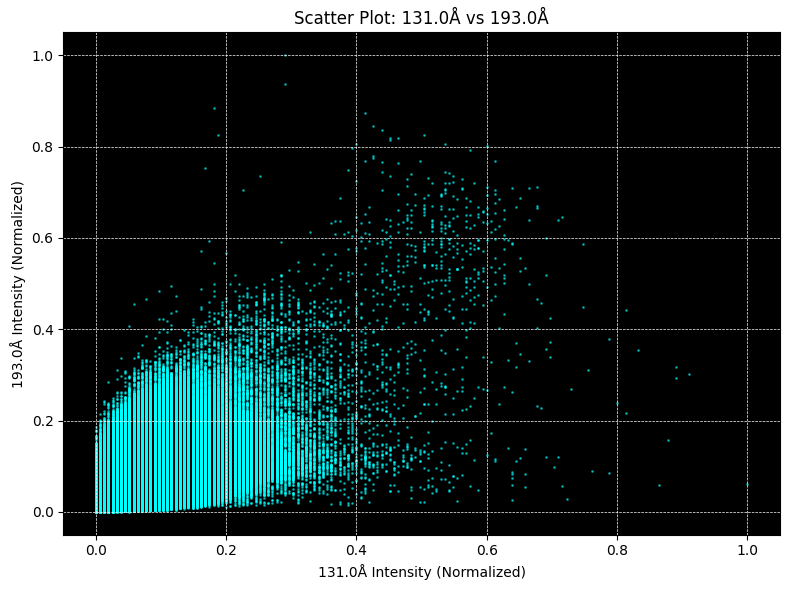

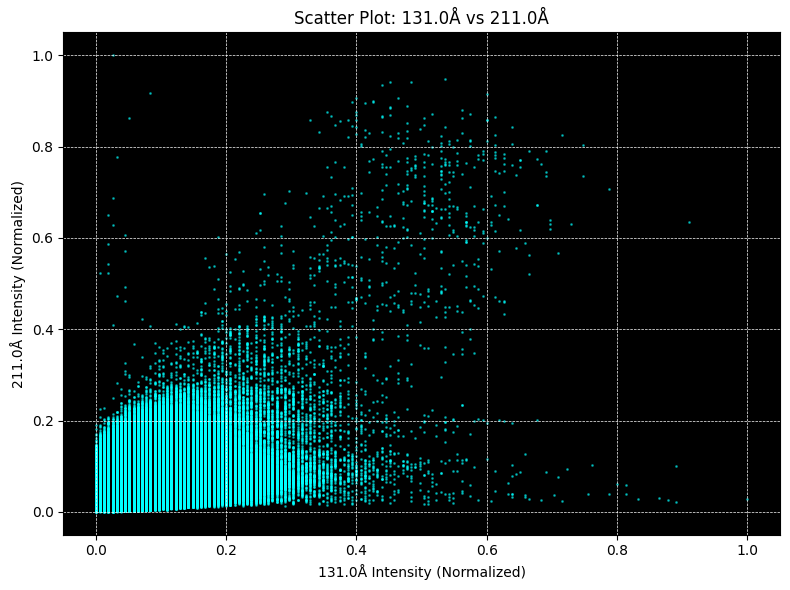

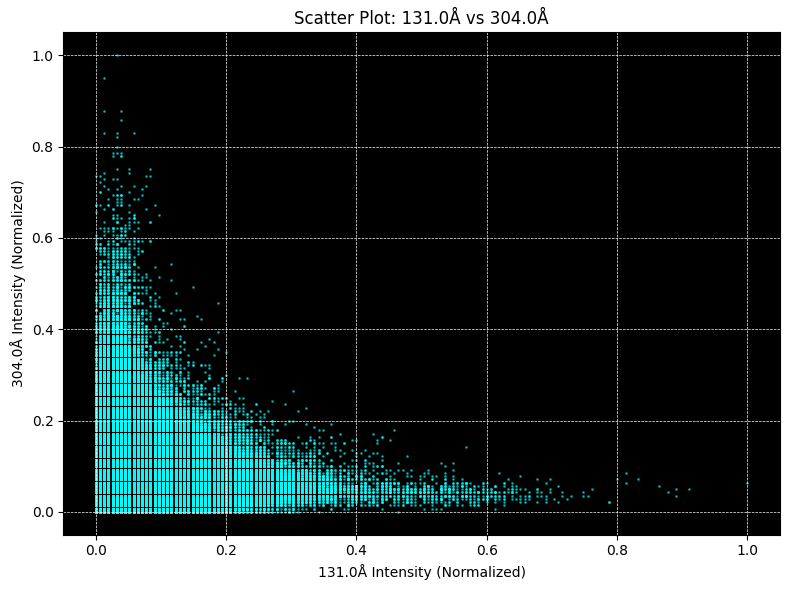

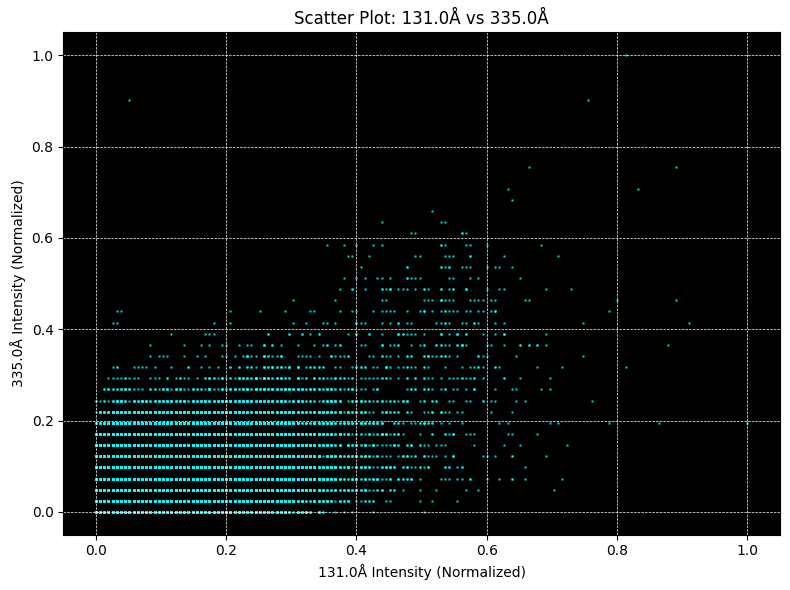

...

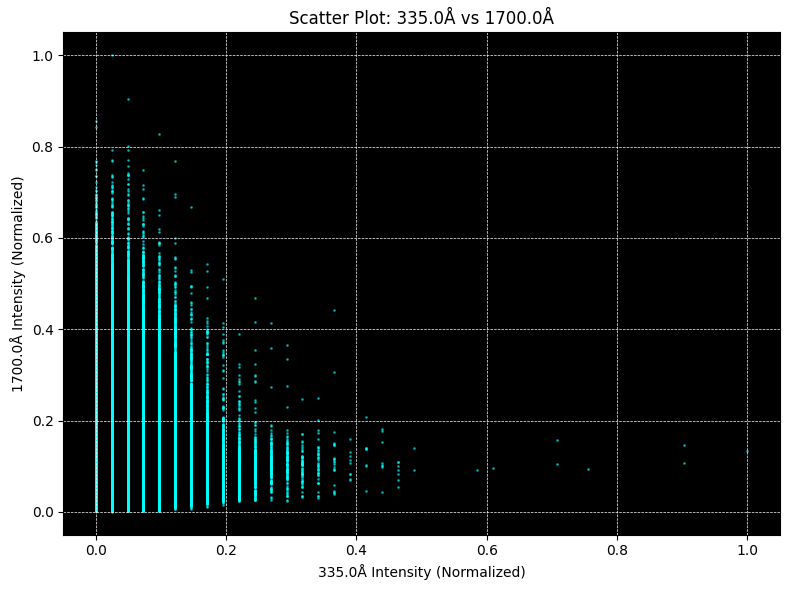

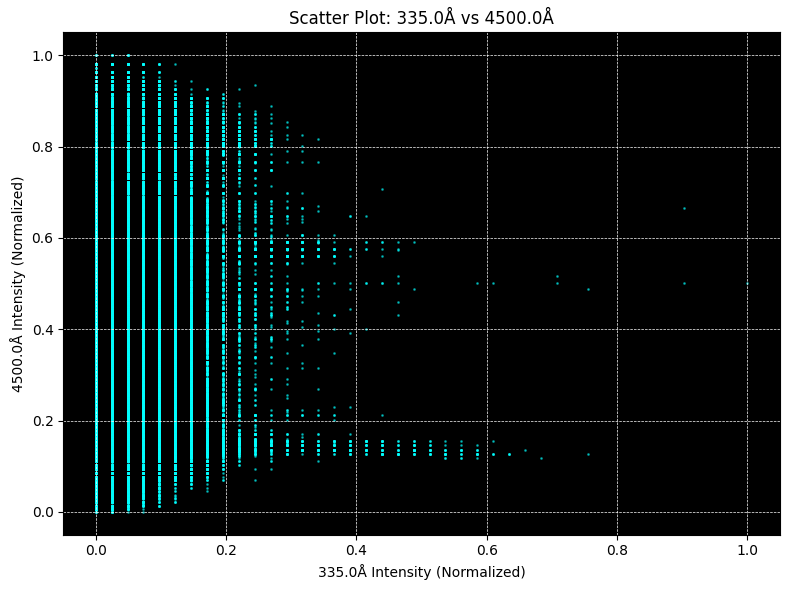

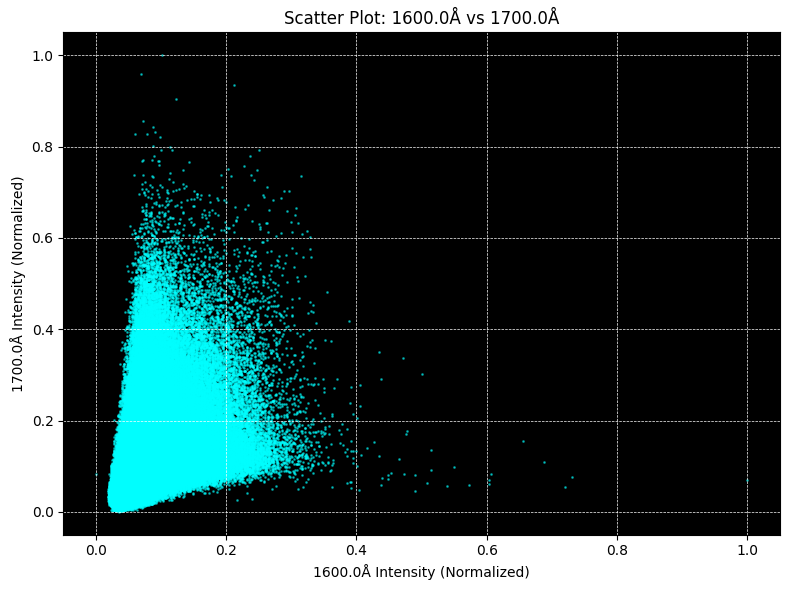

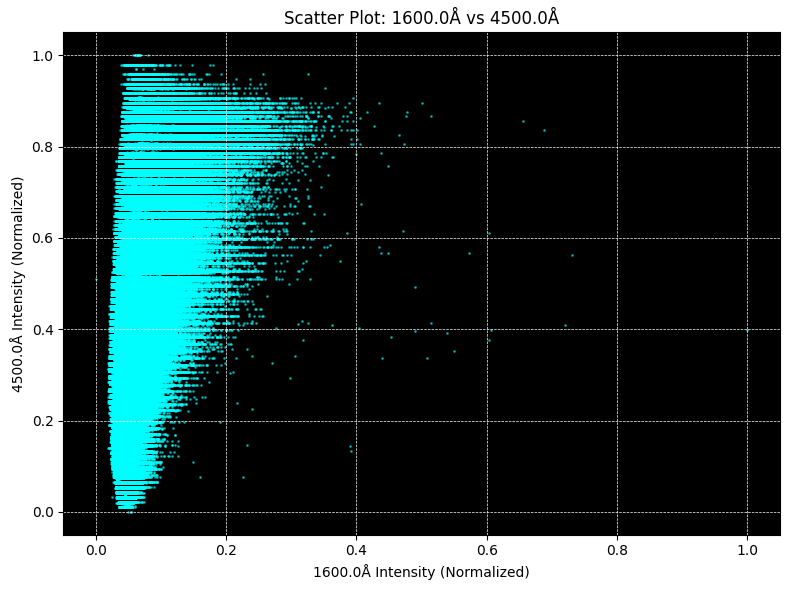

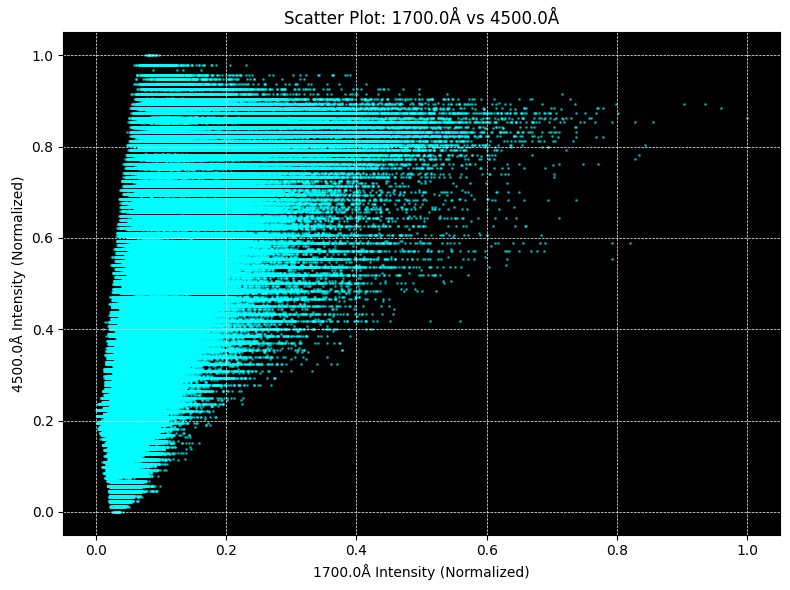

In [15]:
combinations = [(c1, c2) for i, c1 in enumerate(channels) for c2 in channels[i+1:]]
for c1, c2 in combinations:
    if c1 in channel_data and c2 in channel_data:
        data1 = channel_data_process[c1]
        data2 = channel_data_process[c2]
        
        # Filtrar valores válidos (positivos y no NaN)
        valid_mask = (~np.isnan(data1)) & (~np.isnan(data2)) & (data1 > 0) & (data2 > 0)
        data1 = data1[valid_mask]
        data2 = data2[valid_mask]
        data1 = (data1-np.nanmin(data1))/(np.nanmax(data1)-np.nanmin(data1))
        data2 = (data2-np.nanmin(data2))/(np.nanmax(data2)-np.nanmin(data2))
                
        if len(data1) == 0 or len(data2) == 0:
            print(f"Sin datos válidos para los canales {c1} y {c2}.")
            continue
        
        # Scatter plot
        plt.figure(figsize=(8, 6), facecolor="white")  # Fondo negro para la figura
        plt.gca().set_facecolor('black')  # Fondo negro para los ejes
        plt.scatter(data1, data2, s=1, alpha=0.5, c="cyan")  # Puntos en color cian
        plt.title(f"Scatter Plot: {c1} vs {c2}", color="black")  # Título en blanco
        plt.xlabel(f"{c1} Intensity (Normalized)", color="black")  # Etiqueta X en blanco con aclaración
        plt.ylabel(f"{c2} Intensity (Normalized)", color="black")  # Etiqueta Y en blanco con aclaración
        # plt.xscale("log")
        # plt.yscale("log")
        plt.grid(True, which="both", linestyle="--", linewidth=0.5, color="white")
        plt.tight_layout()
        plt.show()


## Análisis de diferencias en escalas de píxeles y valores de intensidad entre  para Expansión a análisis multicanal (3D o más)

In [ ]:
# Convertir table_data_process a un diccionario para facilitar el acceso
table_data_dict = {item["Channel"]: item for item in table_data_process}

# Crear DataFrame con estadísticas y metadatos de canales
channel_stats = []
for channel, data in channel_data.items():
    if data is not None:
        valid_data = data[~np.isnan(data)]  # Ignorar valores NaN en los datos
        
        # Extraer los metadatos del diccionario creado
        if channel in table_data_dict:
            metadata = table_data_dict[channel]
            stats = {
                "Channel": channel,
                "Mean Intensity": np.mean(valid_data),
                "Std Dev Intensity": np.std(valid_data),
                "Min Intensity": np.min(valid_data),
                "Max Intensity": np.max(valid_data),
                "Pixel Scale (CDELT1)": metadata["CDELT1"],
                "Pixel Scale (CDELT2)": metadata["CDELT2"],
                "Rotation (CROTA2)": metadata["CROTA2"]
            }
            channel_stats.append(stats)

# Convertir la lista de estadísticas en un DataFrame
df_stats = pd.DataFrame(channel_stats)

# Mostrar el DataFrame con las estadísticas y metadatos
print(df_stats)


   Channel  Mean Intensity  Std Dev Intensity  Min Intensity  Max Intensity  \
0   131.0Å        4.617876           6.143251           -8.0          546.0   
1   171.0Å      147.564926         154.431549           -8.0         2606.0   
2   193.0Å       99.693855         123.048622           -8.0         3685.0   
3   211.0Å       30.639965          40.769974           -8.0         1832.0   
4   304.0Å        4.415954           5.415650           -8.0          224.0   
5   335.0Å        0.838066           1.644124           -8.0          982.0   
6  1600.0Å       31.328505          34.113632           -8.0         7956.0   
7  1700.0Å      303.374878         332.223724           -8.0         5670.0   
8  4500.0Å     4886.205566        4838.094727           -8.0        15663.0   

   Pixel Scale (CDELT1)  Pixel Scale (CDELT2)  Rotation (CROTA2)  
0              0.600698              0.600698          -0.138902  
1              0.599489              0.599489           0.019441  
2       

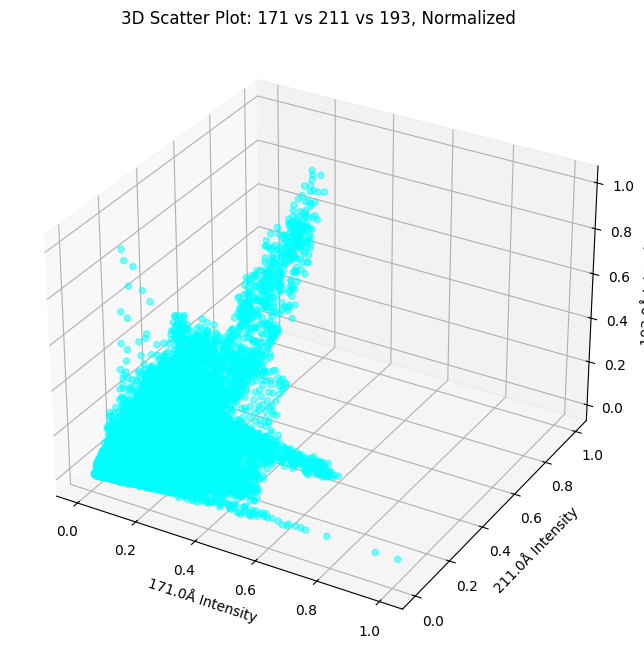

In [16]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
data1, data2, data3 = channel_data_process["171.0Å"], channel_data_process["211.0Å"], channel_data_process["193.0Å"]
data1 = (data1-np.nanmin(data1))/(np.nanmax(data1)-np.nanmin(data1))
data2 = (data2-np.nanmin(data2))/(np.nanmax(data2)-np.nanmin(data2))
data3 =  (data3-np.nanmin(data3))/(np.nanmax(data3)-np.nanmin(data3))
valid_mask = (~np.isnan(data1)) & (~np.isnan(data2)) & (~np.isnan(data3))
ax.scatter(data1[valid_mask], data2[valid_mask], data3[valid_mask], c='cyan', alpha=0.5)

ax.set_xlabel("171.0Å Intensity")
ax.set_ylabel("211.0Å Intensity")
ax.set_zlabel("193.0Å Intensity")
plt.title("3D Scatter Plot: 171 vs 211 vs 193, Normalized")
plt.show()


## Definición de criterios para anomalías

Utilizaremos estadísticas como valores extremos, desviaciones estándar, o análisis multicanal para definir anomalías. Un ejemplo sencillo

In [20]:
def detect_anomalies(data):
    lower_bound = np.nanmean(data) - 3 * np.nanstd(data)
    upper_bound = np.nanmean(data) + 3 * np.nanstd(data)
    return (data < lower_bound) | (data > upper_bound)

anomalies = detect_anomalies(data1)
print(f"Anomalías detectadas en el  171  como pixeles: {np.sum(anomalies)}")


Anomalías detectadas en el  171  como pixeles: 117614


 PCA o clustering
Usa PCA para reducir la dimensionalidad y visualizar patrones:

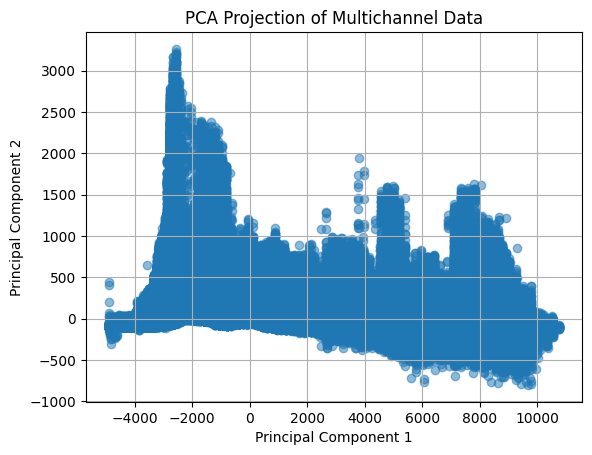

In [21]:
from sklearn.decomposition import PCA

valid_data = np.array([data.flatten() for data in channel_data.values() if data is not None]).T
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(valid_data)

plt.scatter(reduced_data[:, 0], reduced_data[:, 1], alpha=0.5)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Projection of Multichannel Data")
plt.grid()
plt.show()
